In [44]:
import folium
import pandas as pd
from pandas import read_sql
import numpy as np
import re
import branca
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import math
import plotly
import sqlite3 as sql
import json
from tqdm import tqdm


### Process data (2019)
We subset a random sample of the data, and process it to include longitude and latitude coordinates as seperate columns using regular expressions. Here we use 2019 data where geometries exist, which is the latest year before coordinate tracking was depreciated.

In [45]:
# Import 2019 data with geometries
df_full = pd.read_csv('csv/parking_citations_w_geom_2019.csv')
# Take random sample to map
df = df_full.sample(frac=0.005, random_state=0)


In [46]:
# Dataframe dimensions
length = df.shape[0]
width = df.shape[1]
df.shape

(5343, 10)

In [47]:
# Get latitude and longitude coordinates in seperate columns using regex
for i in range(length):
    coordinates = re.findall('[-0-9.]+', df.loc[df.index[i], 'geom'])
    df.loc[df.index[i], 'lat'] = coordinates[1]
    df.loc[df.index[i], 'lon'] = coordinates[0]

In [48]:
# Drop geom column
df = df.drop(columns=['geom'])

In [49]:
# Convert to pandas datetime, add time of day as column
df.loc[:, 'Citation_Issued_DateTime'] = pd.to_datetime(df['Citation_Issued_DateTime'])
df['time_of_day'] = df['Citation_Issued_DateTime'].dt.hour

df_full.loc[:, 'Citation_Issued_DateTime'] = pd.to_datetime(df_full['Citation_Issued_DateTime'])
df_full['time_of_day'] = df_full['Citation_Issued_DateTime'].dt.hour

In [50]:
# Check for NA's: there are no NA's for desired columns
df.isnull().sum(axis = 0)

Citation_Number               0
Citation_Issued_DateTime      0
Violation                     0
Violation_Description         0
Citation_Location             9
Vehicle_Plate_State         198
Vehicle_Plate               220
Fine_Amount                   0
Date_Added                    0
lat                           0
lon                           0
time_of_day                   0
dtype: int64

In [51]:
# Check work
df.head()

,Citation_Number,Citation_Issued_DateTime,Violation,Violation_Description,Citation_Location,Vehicle_Plate_State,Vehicle_Plate,Fine_Amount,Date_Added,lat,lon,time_of_day
1019861,PD34613596,2019-08-13 14:05:00,V5202,NOPL/PRDSP,IRONWOOD AT CATALINA,CA,4XNF490,121.0,2020-04-30T00:00:00,37.73629004500003,-122.38011988899996,14
899663,925928813,2019-12-04 10:23:00,TRC7.2.70,OBSTRCT TF,233 SERRANO DR,CA,8BDZ371,110.0,2020-07-27T00:00:00,37.71971298700004,-122.47937603999998,10
973061,909704062,2019-05-01 14:47:00,TRC7.2.23B,MTR OUT DT,317 09TH ST,CA,7MQS630,76.0,2020-04-30T00:00:00,38.24842055800008,-122.036426329,14
208804,1005658183,2019-03-07 13:56:00,TRC7.2.38,PK STANDS,331 TOWNSEND,CA,7NDE878,110.0,2022-04-11T00:00:00,37.776536270000065,-122.39560939499995,13
688599,911650331,2019-07-09 12:18:00,TRC7.2.22,STR CLEAN,962 PAGE ST,CA,22T8130,79.0,2020-07-27T00:00:00,37.77256499400005,-122.43665800499997,12


### Time of day
Explore the role of the time of day on parking citations.

#### Map individual citations colorcoded by time (2019)
We use data from 2019 which is the most recent year before tracking coordinates was depreciated.

In [52]:
# Create folium map
map = folium.Map(location = [37.7749, -122.4194], zoom_start = 14)
folium.TileLayer('cartodbpositron').add_to(map)

In [53]:
# Create colormap to colorcode datapoints by time of day
colormap = branca.colormap.LinearColormap(colors=['#7F33FF', '#FF9033', '#FFFF33', '#FF9033', '#7F33FF'], index=[0, 6, 12, 18, 24], vmin=0, vmax=24)
colormap.caption = 'Time of day'
colormap.add_to(map)

In [54]:
def popup_html(i, data):
    """Define function to parse HTML for folium popup. i is row of citation data (df)"""
    
    df = data
    fine_amount = df['Fine_Amount'].iloc[i]
    citation_location = df['Citation_Location'].iloc[i]
    violation_desc = df['Violation_Description'].iloc[i]
    datetime = df['Citation_Issued_DateTime'].iloc[i]


    html = f"""<!DOCTYPE html>
    <html>
    <table style="height: 120px; width: 360px;">
    <tbody>
    <tr>
    <td>Citation Location</td>
    <td>{citation_location}</td>
    </tr>
    <tr>
    <td>Citation Amount</td>
    <td>{fine_amount}</td>
    </tr>
    <tr>
    <td>Violation Description</td>
    <td>{violation_desc}</td>
    </tr>
    <tr>
    <td>Datetime</td>
    <td>{datetime}</td>
    </tr>
    </tbody>
    </table>
    </html>
    """
    return html

In [55]:
for i in range(len(df.index)):
    lat = df.iloc[i, -3]
    lon = df.iloc[i, -2]
    coordinates = [float(lat), float(lon)]
    hour = df.loc[df.index[i], 'time_of_day']

    # create html table for current data point; add as popup
    html = popup_html(i, df)
    popup = folium.Popup(folium.Html(html, script=True))

    # add parking citation as folium Circle
    circle = folium.CircleMarker(coordinates, color = colormap(hour), radius = 2.5, fill = True, fillOpacity=1, popup = popup)
    map.add_child(circle)
    

In [56]:
# add layer control
folium.LayerControl().add_to(map)

In [57]:
fig = folium.Figure(width = 900, height = 400)
fig.add_child(map)

In [58]:
map.save('html/citations_over_time_2019_map.html')

#### Fraction of citations vs. time of day

In [59]:
# create array of hours and fraction of total citations that occured in those hours
hours = np.arange(24)
citation_frac = df.groupby(['time_of_day']).size() / len(df.index)

# create interactive plot
fig = px.bar(x=hours, y=citation_frac)
fig.update_layout(
    title='Fraction of parking citations vs. time of day (2019)',
    xaxis_title='time of day',
    yaxis_title='fraction of parking citations',
    font=dict(
        family="Courier New, monospace",
        size=14,
        color='Black'
    )
)

# allows for plot to be exported into html in notebook
fig.show(renderer='notebook')
plotly.offline.plot(fig, filename = 'html/citations_over_time_2019.html', auto_open=False)


'html/citations_over_time_2019.html'

#### Types of citations vs. time of day


In [60]:
# Get top 10 most common types of citations
common_violations = df_full['Violation_Description'].value_counts()[0:10]
common_violations

STR CLEAN     396770
MTR OUT DT    120042
RES/OT         81433
METER DTN      45192
FAIL DISPL     41021
PRK PROHIB     40107
REG TABS       34281
DBL PARK       30211
NO PLATES      25733
PRK GRADE      23855
Name: Violation_Description, dtype: int64

In [61]:
# Plot most common types of citations for each hour of the day
# Create figure
fig = go.Figure()

# Add traces, one for each slider step/hour of the day
for step in np.arange(24):
    # Subset data based on the hour of the day (take only violations that in in common violations)
    subset = df_full[df_full['time_of_day'] == step]
    subset = subset.loc[subset['Violation_Description'].isin(common_violations.index)]

    # Get counts of common violations
    subset_counts = subset['Violation_Description'].value_counts()
    # Normalize to total violations
    subset_counts = subset_counts / len(df_full.index)

    # Add bar plots of subsetted violation counts to figure
    fig.add_trace(
        go.Bar(
            visible=False,
            x=common_violations.index,
            y=subset_counts))

# Make 12th trace/hour visible (first shown)
fig.data[12].visible = True

# Create and add slider
steps = []
for i in range(len(fig.data)):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)}],  # layout attribute
        label=str(i),
    )
    step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=12,
    currentvalue={"prefix": "Time of day: ",
                  "suffix": " Hours"},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders,
    yaxis_range=[0, 0.072],
    title="Frequency of violation types over time (2019)",
    xaxis_title="Time of day (hrs)",
    yaxis_title="Fraction of total violations"
)

fig.update_xaxes(tickangle=0)

fig.show(renderer='notebook')
plotly.offline.plot(fig, filename = 'html/violation_types_over_time_2019.html', auto_open=False)


'html/violation_types_over_time_2019.html'

### Estimated annual revenue by zip code
Zip-codes are fetched for subsets on the 2018-2022 data, although for the initial analysis we focus on the most recent 2022 data. Here, we explore the total annual revenue of each zip code by aggregating fine amounts for each zip code and scaling up by the fraction of the data subset.

$$
\hat{R_{i}} = \frac{\sum\limits_{k=1}^{n_i} F_{ik}}{p}
$$

where $R_{estimated, i}$ is the estimated revenue from the ith zipcode, $F_{ik}$ is the fine amount for the kth citation in the ith zipcode, and $p$ is the fraction of the parent data that was subsetted.

#### Process Data

In [62]:
# Import 2022 data with zip codes
df = pd.read_csv('csv/subset_2022_w_zipcodes.csv')

In [63]:
def find_fraction(year, subset_df):
    '''Get fraction of parent dataset in given subsetted data and its respective year by quering database'''

    # Open connection with db
    connection = sql.connect("sfmta_parking_citations.db")
    cursor = connection.cursor()

    year = year
    next_year = year + 1

    query_str = f"""
                SELECT COUNT(Citation_Number) AS counts FROM parking_citations
                WHERE citation_issued_datetime BETWEEN '{year}-01-01' AND '{next_year}-01-01'
                """

    result = read_sql(query_str, connection)

    # Fraction of parent database
    parent_length = int(result['counts'])
    p = len(subset_df.index) / parent_length

    # Close database connection
    connection.close()

    return p

In [64]:
p = find_fraction(2022, df)
p

0.001000071947622131

In [65]:
# Drop NA zipcodes
df = df.dropna(axis=0, how='any', subset=['Zip_Code'])

In [66]:
# Check for NA's: there are no NA's for desired columns
df.isnull().sum(axis = 0)

Citation_Number                0
Citation_Issued_DateTime       0
Violation                      0
Violation_Description          0
Citation_Location              0
Vehicle_Plate_State            0
Vehicle_Plate                  0
Fine_Amount                    0
Date_Added                     0
geom                        1010
Zip_Code                       0
dtype: int64

In [67]:
def estimated_revenue(df):
    '''Group by zip code and get estimated revenue for given df'''
    
    df_byzip = df.groupby(['Zip_Code']).sum()
    df_byzip = df_byzip.rename(columns={'Fine_Amount': 'estimated_revenue'})

    df_byzip.loc[:, 'estimated_revenue'] = df_byzip['estimated_revenue'] / p

    # if geom in columns, drop geom
    if 'geom' in df_byzip.columns.to_list():
        df_byzip = df_byzip.drop(columns=['geom'])

    return df_byzip

df_byzip = estimated_revenue(df)
df_byzip.head()

,estimated_revenue
Zip_Code,
94102.0,6.408539e+06
94103.0,7.687447e+06
94104.0,1.170916e+06
94105.0,2.678807e+06
94107.0,6.778512e+06


In [68]:
# Import zipcode geojson file
with open('geo_json/San_Francisco_ZIP_Codes.geojson') as f:
    json = json.load(f)

In [69]:
len(json['features'])

32

In [70]:
json['features'][5]['properties']

{'zip_code': '94133',
 'zip': '94133',
 'st_area_sh': '20409077.9589',
 'sqmi': '0.73',
 'state': 'CA',
 'pop10_sqmi': '34200.0',
 'st_length_': '39351.7196004',
 'objectid': '59',
 'po_name': 'San Francisco',
 'pop2010': '24966',
 'id': '94133',
 'multigeom': 'true'}

In [71]:
# read properties as df
zip_properties = pd.DataFrame(index=np.arange(len(json['features'])), dtype=object)

for i in range(len(json['features'])):
    zip_properties.loc[zip_properties.index[i], 'zip_code'] = int(json['features'][i]['properties']['zip_code'])
    zip_properties.loc[zip_properties.index[i], 'area_sqmi'] = float(json['features'][i]['properties']['sqmi'])
    zip_properties.loc[zip_properties.index[i], 'population_2010'] = int(json['features'][i]['properties']['pop2010'])

zip_properties.head()

,zip_code,area_sqmi,population_2010
0,94124.0,4.87,37233.0
1,94127.0,1.70,19116.0
2,94131.0,2.17,24202.0
3,94133.0,0.73,24966.0
4,94132.0,4.19,26986.0


In [72]:
# save zipcode properties as csv
zip_properties.to_csv('csv/zipcode_properties.csv')

In [73]:
# add zipcode properties to df_byzip
df_byzip.index.rename('zip_code', inplace=True)

In [74]:
df_byzip = df_byzip.merge(zip_properties, on=['zip_code'], how='outer')
df_byzip = df_byzip.drop_duplicates()
df_byzip.head()

,zip_code,estimated_revenue,area_sqmi,population_2010
0,94102.0,6.408539e+06,0.68,40644.0
1,94103.0,7.687447e+06,1.33,30364.0
2,94104.0,1.170916e+06,0.08,1524.0
3,94105.0,2.678807e+06,0.45,20802.0
4,94107.0,6.778512e+06,1.86,13178.0


#### Choropleth map of estimated revenue for zip codes

In [75]:
# Create folium map
map = folium.Map(location = [37.7749, -122.4194], zoom_start = 14)
# folium.TileLayer('cartodbpositron').add_to(map)

In [76]:
# Create the choropleth
cp = folium.Choropleth(
    geo_data=json,
    name="choropleth",
    data=df_byzip,
    columns=["zip_code", "estimated_revenue"],
    key_on="feature.properties.zip_code",
    fill_color="YlGnBu",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Estimated Annual Revenue",
    ).add_to(map)

In [77]:
## Add tooltip

# create indexed dataframe
df_byzip_indexed = df_byzip.set_index('zip_code') 

In [78]:
# Loop through current geojson and add property estimated_revenue (assigned from indexed dataframe)
for s in cp.geojson.data['features']:
    s['properties']['estimated_revenue'] = round(float(df_byzip_indexed.loc[int(s['properties']['zip_code']), 'estimated_revenue']), 2)

In [79]:
# Check
cp.geojson.data['features'][0]['properties']['estimated_revenue']

1589885.61

In [80]:
# add tooltip
folium.GeoJsonTooltip(['zip_code', 'estimated_revenue']).add_to(cp.geojson)

In [81]:
# add layer control
folium.LayerControl().add_to(map)

In [82]:
# save map
fig = folium.Figure(width = 900, height = 400)
fig.add_child(map)


In [83]:
map.save('html/estimated_revenue_by_zip_2022_map.html')

#### Correlation matrix between estiamted revenue (2022), population (2010), and zipcode area

We find that there is a weak correlation between population and estimated revenue. This makes sense, since foot traffic may be more correlated with parking revenue than population. For exampele, there may not be a lot of residential population in downtown areas, but the foot traffic and estimated revenues are high. Interestingly, there is a weak negative correlation between revenue and zip code area. This may because large zipcodes are more residential and therefore have less traffic, as seen in the larger positive correlation between population and area.

In [84]:
correlations = df_byzip[['estimated_revenue', 'area_sqmi', 'population_2010']].corr()
correlations

,estimated_revenue,area_sqmi,population_2010
estimated_revenue,1.000000,-0.203443,0.360004
area_sqmi,-0.203443,1.000000,0.516900
population_2010,0.360004,0.516900,1.000000


In [85]:
correlations.to_csv('csv/zipcode_correlations.csv')

### Descriptive statistics of estimated revenue at the zip code level

In [86]:
stats = df_byzip['estimated_revenue'].describe()
stats

count    2.500000e+01
mean     3.877001e+06
std      2.531964e+06
min      1.739875e+05
25%      1.699878e+06
50%      3.603741e+06
75%      5.752586e+06
max      9.474318e+06
Name: estimated_revenue, dtype: float64

In [87]:
stats.to_csv('csv/descriptive_stats2022.csv')

### Trend of parking citations over time

In this section we study the trend and seasonality of total estimated revenue using data from 2018-2022.

#### Process data


In [88]:
# Import 2018-2022 subsetted data with zip codes
df2018 = pd.read_csv('csv/subset_2018_w_zipcodes.csv')
df2019 = pd.read_csv('csv/subset_2019_w_zipcodes.csv')
df2020 = pd.read_csv('csv/subset_2020_w_zipcodes.csv')
df2021 = pd.read_csv('csv/subset_2021_w_zipcodes.csv')
df2022 = pd.read_csv('csv/subset_2022_w_zipcodes.csv')

In [89]:
# Combine dataframes
frames = [df2018, df2019, df2020, df2021, df2022]
df_all = pd.concat(frames)

# Convert Citation_Issued_DateTime to pandas datetime
df_all['Citation_Issued_DateTime'] = pd.to_datetime(df_all['Citation_Issued_DateTime'])


In [90]:
# Get proportions of subsets
years = [2018, 2019, 2020, 2021, 2022]
proportions = []

for i, frame in tqdm(enumerate(frames), desc='finding fractions: '):
    proportions.append(find_fraction(year=years[i], subset_df=frame))


proportions

finding fractions: : 5it [01:00, 12.17s/it]


[0.0009996520341006582,
 0.0010003087077112315,
 0.0009999291287344325,
 0.001000132437628727,
 0.001000071947622131]

In [91]:
# Add month and year as seperate columns
df_all['month'] = pd.DatetimeIndex(df_all['Citation_Issued_DateTime']).month
df_all['year'] = pd.DatetimeIndex(df_all['Citation_Issued_DateTime']).year

df_all

,Citation_Number,Citation_Issued_DateTime,Violation,Violation_Description,Citation_Location,Vehicle_Plate_State,Vehicle_Plate,Fine_Amount,Date_Added,geom,Zip_Code,month,year
0,894611336,2018-03-21 16:42:00,V22500I,BUS ZONE,1200 09TH AVE,CA,JNAKPUR,288.0,2018-03-30T00:00:00,POINT (-122.37115098699996 37.831231348000074),94122.0,3,2018
1,895261146,2018-03-13 06:57:00,TRC7.2.22,STR CLEAN,3740 CALIFORNIA ST,CA,7YPD804,73.0,2018-03-30T00:00:00,POINT (-122.45577201399999 37.786574004000045),94118.0,3,2018
2,904303680,2018-11-15 09:42:00,TRC7.2.22,STR CLEAN,2405 PACIFIC AVE,CA,6PPK258,76.0,2020-04-30T00:00:00,POINT (-122.43518496999997 37.79301801100007),94115.0,11,2018
3,902510000,2018-10-14 18:31:00,V5204A,REG TABS,329 EMBARCADERO SOUTH,CA,7VKT030,121.0,2018-10-26T00:00:00,POINT (-122.39499430399997 37.79656569700006),NaN,10,2018
4,895606143,2018-03-22 13:13:00,TRC7.2.20,RES/OT,1451 GREENWICH ST,CA,B584T0,84.0,2021-05-21T00:00:00,POINT (-122.42355408599997 37.80043845000006),94109.0,3,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1107,953915502,2022-08-09 12:24:00,TRC7.2.22,STR CLEAN,545 CABRILLO ST,CA,4ZIP938,87.0,2022-09-01T00:00:00,NaN,94118.0,8,2022
1108,953950594,2022-08-10 06:26:00,TRC7.2.22,STR CLEAN,1509 PACIFIC AVE,CA,5FUV628,87.0,2022-10-21T00:00:00,NaN,94109.0,8,2022
1109,948929601,2022-03-15 09:50:00,TRC7.2.23B,MTR OUT DT,1440 BROADWAY,CA,15R7456,86.0,2022-12-18T00:00:00,NaN,94109.0,3,2022
1110,953855254,2022-09-08 07:27:00,V22500E,DRIVEWAY,1127 TREAT AVE,CA,6CJK555,108.0,2022-09-15T00:00:00,NaN,94110.0,9,2022


#### Estimated revenue from 2018-2022

After plotting the estimated revenue of parking citations over time, we find a significant decrease following the COVID-19 pandemic in 2022, with a sharp increase in 2021 and 2022. However, parking revenue is still lower than pre-pandemic levels. Overall, estimated revenue from the last 5 years are of the same order of magnitude and do not flucuate much.

In [92]:
# Get total estimated revenue by year
revenue_byyear = df_all.groupby(['year']).sum()['Fine_Amount']

# Divide each year by their respective subset proportions
revenue_byyear = revenue_byyear.div(proportions)

revenue_byyear

year
2018    1.202208e+08
2019    1.203778e+08
2020    7.186709e+07
2021    1.045592e+08
2022    1.074823e+08
Name: Fine_Amount, dtype: float64

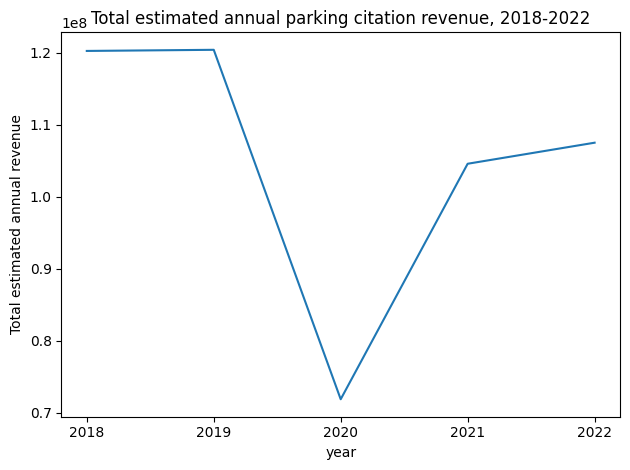

In [93]:
revenue_byyear.plot()
plt.ylabel('Total estimated annual revenue')
plt.title('Total estimated annual parking citation revenue, 2018-2022')
plt.xticks(range(2018, 2023))

plt.tight_layout()
plt.savefig('figures/parking_citations_by_year.png', dpi=300)
plt.show()

#### Number of citations seasonally (by month)
We estimate the number of monthly in a similar fashion to annual revenue, again using the fraction of the data subset.


In [94]:
# monthly citation counts in subset
citation_counts = df_all.groupby(['year', 'month']).count()['Citation_Number']

In [95]:
# reduce multi-index to single index
citation_counts = citation_counts.reset_index(level=[0,1])

In [96]:
# get estimated total counts using subset proportion
for i, year in enumerate(years):
    citation_counts.loc[citation_counts['year'] == year, 'Citation_Number'] = \
    citation_counts.loc[citation_counts['year'] == year, 'Citation_Number'] / \
    proportions[i]

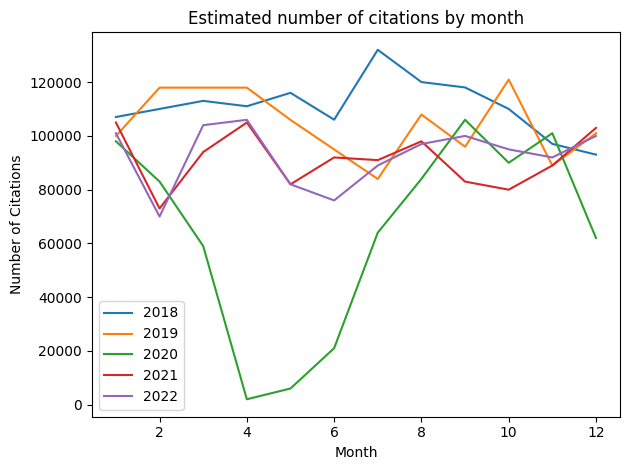

In [97]:
plt.plot(np.arange(1, 13), citation_counts.loc[citation_counts['year'] == 2018, 'Citation_Number'], label='2018')
plt.plot(np.arange(1, 13), citation_counts.loc[citation_counts['year'] == 2019, 'Citation_Number'], label='2019')
plt.plot(np.arange(1, 13), citation_counts.loc[citation_counts['year'] == 2020, 'Citation_Number'], label='2020')
plt.plot(np.arange(1, 13), citation_counts.loc[citation_counts['year'] == 2021, 'Citation_Number'], label='2021')
plt.plot(np.arange(1, 13), citation_counts.loc[citation_counts['year'] == 2022, 'Citation_Number'], label='2022')

plt.ylabel('Number of Citations')
plt.xlabel('Month')
plt.title('Estimated number of citations by month')

plt.legend()
plt.tight_layout()

plt.savefig('figures/ctiations_by_month.png', dpi=300)